# Import Libraries

In [1]:


import pandas as pd
import numpy as np
import plotly.express as px
from pandas_profiling import ProfileReport

In [2]:
startDate = '1992-01-01'

In [3]:
def formatDates(data, position):
    dates = []
    for index, row in data.iterrows():
        dates.append(str(row[position])[:8] + '01')
    return dates

def resampleMonthly(data, dateColumn, dateLocation, on, method):
    df = data.resample('M', on=on).mean().interpolate(method=method)
    df.reset_index(inplace=True)
    df[dateColumn] = formatDates(df, dateLocation)
    df[dateColumn] = pd.to_datetime(df[dateColumn])
    df.sort_values(dateColumn, inplace=True)
    df.set_index(dateColumn,inplace=True)
    return df

# All EU Dataset

In [4]:
EUdata = pd.read_csv('data/apro_mt_pwgtm_1_Data.csv')
EUdata = EUdata[EUdata['UNIT'] == 'Thousand tonnes']
EUdata = EUdata[['TIME', 'GEO', 'MEAT', 'Value']]
EUdata.columns = ['Date', 'Country', 'Meat', 'Value']
EUdata = EUdata[EUdata.Meat == 'Bovine meat']

EUdata.Date = pd.to_datetime(EUdata.Date, format='%YM%m')
EUdata = EUdata[EUdata.Date >= startDate]

EUdata['Country'] = EUdata['Country'].str.slice(0,7)
EUdata = EUdata.replace([':'], 0, regex=True)
EUdata['Value'] = EUdata['Value'].astype(float)

EUdata.reset_index(inplace=True, drop=True)

EUdata

,Date,Country,Meat,Value
0,1992-01-01,Germany,Bovine meat,159.17
1,1992-01-01,Ireland,Bovine meat,35.00
2,1992-02-01,Germany,Bovine meat,140.11
3,1992-02-01,Ireland,Bovine meat,31.90
4,1992-03-01,Germany,Bovine meat,164.54
...,...,...,...,...
721,2022-01-01,Ireland,Bovine meat,47.36
722,2022-02-01,Germany,Bovine meat,78.00
723,2022-02-01,Ireland,Bovine meat,49.77
724,2022-03-01,Germany,Bovine meat,0.00


In [5]:
EUdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 726 entries, 0 to 725
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   Date     726 non-null    datetime64[ns]
 1   Country  726 non-null    object        
 2   Meat     726 non-null    object        
 3   Value    726 non-null    float64       
dtypes: datetime64[ns](1), float64(1), object(2)
memory usage: 22.8+ KB


# Ireland Slaughter Data

In [6]:
irelandData = EUdata[EUdata['Country'] == 'Ireland'].reset_index(drop=True)
irelandData = irelandData.pivot_table(index='Date', columns='Meat', values='Value')
irelandData.reset_index(inplace=True)
irelandData.set_index('Date',inplace=True)
irelandData.columns = ['Ireland Bovine Meat']
irelandData

,Ireland Bovine Meat
Date,
1992-01-01,35.00
1992-02-01,31.90
1992-03-01,46.70
1992-04-01,40.00
1992-05-01,33.80
...,...
2021-11-01,56.15
2021-12-01,45.58
2022-01-01,47.36


## Ireland Data NaN Count

In [7]:
irelandData.isna().sum()

Ireland Bovine Meat    0
dtype: int64

## Ireland Data Box Plot

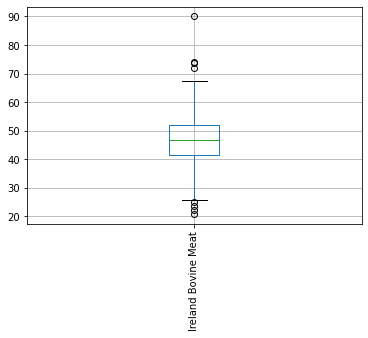

In [8]:
irelandData.boxplot(rot=90);

In [9]:
#https://plotly.com/python/box-plots/
fig = px.box(irelandData)
fig.show()

In [10]:
fig = px.box(irelandData, points='all')
fig.show()

## Ireland Slaughter Plot

In [11]:
fig = px.line(irelandData, labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Ireland', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## Ireland Slaughter Growth Plot

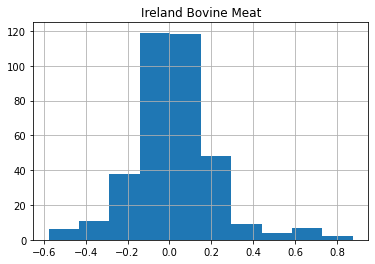

In [12]:
irelandData.pct_change().hist();

In [13]:
fig = px.line(irelandData.pct_change(), labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Ireland', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

In [14]:
fig = px.line(irelandData.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth Ireland', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

# Germany Slaughter Data

In [15]:
germanData = EUdata[EUdata['Country'] == 'Germany'].reset_index(drop=True)
germanData = germanData.pivot_table(index='Date', columns='Meat', values='Value')
germanData.reset_index(inplace=True)
germanData.set_index('Date',inplace=True)
germanData.columns = ['Germany Bovine Meat']

germanData

,Germany Bovine Meat
Date,
1992-01-01,159.17
1992-02-01,140.11
1992-03-01,164.54
1992-04-01,155.61
1992-05-01,144.82
...,...
2021-11-01,104.00
2021-12-01,91.00
2022-01-01,77.00


## Germany NaN Count

In [16]:
germanData.isna().sum()

Germany Bovine Meat    0
dtype: int64

## Germany Data Box Plot

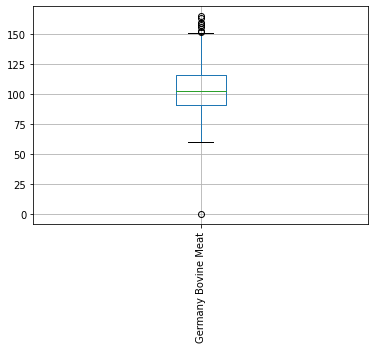

In [17]:
germanData.boxplot(rot=90);

In [18]:
#https://plotly.com/python/box-plots/
fig = px.box(germanData)
fig.show()

In [19]:
fig = px.box(germanData, points='all')
fig.show()

## Germany Slaughter Plot

In [20]:
fig = px.line(germanData, labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Germany', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## Germany Slaughter Growth Plot

In [21]:
fig = px.line(germanData.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth Germany', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

# USA Slaughter Data

In [22]:
usaData = pd.read_excel('data/MeatStatsFullUSA.xlsx', sheet_name='SlaughterWeights-Full',
                   skiprows=2)
dates = usaData.iloc[:,0]

usaData = usaData.iloc[:, 13:]
usaData.insert(loc=0, column='Date', value=dates)
usaData.drop(usaData.head(2).index, inplace=True)
usaData.drop(usaData.tail(6).index, inplace=True)
usaData.Date = pd.to_datetime(usaData.Date, format='%b-%Y')
usaData = usaData[usaData.Date >= startDate].reset_index(drop=True)
usaData.index = usaData.Date
usaData.drop(columns='Date', inplace=True)

usaData['USA Bovine Meat'] = usaData['Cattle.2'] + usaData['Calves.2']
usaData = usaData[['USA Bovine Meat']]
usaData

,USA Bovine Meat
Date,
2022-03-01,987.0
2022-02-01,981.0
2022-01-01,985.0
2021-12-01,977.0
2021-11-01,976.0
...,...
1992-05-01,934.0
1992-04-01,928.0
1992-03-01,927.0


In [23]:
#https://plotly.com/python/box-plots/
fig = px.box(usaData)
fig.show()

## Convert USA Data to Tonne

In [24]:
#usaData = (usaData * 1000) / 2204.6 
usaData = usaData / 0.453592
usaData

,USA Bovine Meat
Date,
2022-03-01,2175.964303
2022-02-01,2162.736556
2022-01-01,2171.555054
2021-12-01,2153.918059
2021-11-01,2151.713434
...,...
1992-05-01,2059.119208
1992-04-01,2045.891462
1992-03-01,2043.686838


## USA Slaughter Plot

In [25]:
fig = px.line(usaData, labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings USA', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## USA Slaughter Growth Plot

In [26]:
fig = px.line(usaData.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth USA', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

# Economic Data Import

## Population Data

### Ireland Population Data

In [27]:
irelandPop = pd.read_csv('data/POPTOTIEA647NWDB.csv', 
                         parse_dates=['DATE'])
irelandPop.columns = ['Date','Ireland Population']
irelandPop = irelandPop[irelandPop.Date >= startDate]

irelandPop = resampleMonthly(irelandPop, 'Date', 0, 'Date', 'linear')

### Germany Population Data

In [28]:
germanyPop = pd.read_csv('data/POPTOTDEA647NWDB.csv',
                    parse_dates=['DATE'])
germanyPop.columns = ['Date','German Population']
germanyPop = germanyPop[germanyPop.Date >= startDate]
germanyPop = resampleMonthly(germanyPop, 'Date', 0, 'Date', 'linear')
germanyPop

,German Population
Date,
1992-01-01,8.062460e+07
1992-02-01,8.066891e+07
1992-03-01,8.071323e+07
1992-04-01,8.075754e+07
1992-05-01,8.080185e+07
...,...
2019-09-01,8.319134e+07
2019-10-01,8.320363e+07
2019-11-01,8.321593e+07


### USA Population Data

In [29]:
usaPop = pd.read_csv('data/POPTOTUSA647NWDB.csv',
                    parse_dates=['DATE'])
usaPop.columns = ['Date','USA Population']
usaPop = usaPop[usaPop.Date >= startDate]
usaPop = resampleMonthly(usaPop, 'Date', 0, 'Date', 'linear')

## GDP

In [30]:
ecoData = pd.read_csv('data/worldBankData.csv', skiprows=4)
ecoData = ecoData[(ecoData['Indicator Name'] == 'GDP (constant LCU)') |
                 (ecoData['Indicator Name'] == 'GDP per capita (current LCU)')].reset_index(drop=True)
ecoData = ecoData.melt(id_vars=['Country Name', 'Indicator Name', 'Indicator Code', 'Country Code'],
                   var_name='Year', value_name='Total')
ecoData.Year = pd.to_datetime(ecoData.Year)
ecoData = ecoData[ecoData.Year >= startDate].reset_index(drop=True)
ecoData = ecoData[['Country Name', 'Indicator Name', 'Year', 'Total']]
ecoData

,Country Name,Indicator Name,Year,Total
0,Germany,GDP per capita (current LCU),1992-01-01,2.111093e+04
1,Germany,GDP (constant LCU),1992-01-01,2.261460e+12
2,Ireland,GDP per capita (current LCU),1992-01-01,1.172765e+04
3,Ireland,GDP (constant LCU),1992-01-01,7.648648e+10
4,United States,GDP per capita (current LCU),1992-01-01,2.541899e+04
...,...,...,...,...
175,Germany,GDP (constant LCU),2021-01-01,NaN
176,Ireland,GDP per capita (current LCU),2021-01-01,NaN
177,Ireland,GDP (constant LCU),2021-01-01,NaN
178,United States,GDP per capita (current LCU),2021-01-01,NaN


### Ireland GDP

In [31]:
irelandGDP = ecoData[ecoData['Country Name'] == 'Ireland']
irelandGDP = irelandGDP.pivot_table(index='Year', columns='Indicator Name', values='Total')
irelandGDP.columns = ['Ireland GDP', 'Ireland GDP Per Capita']
irelandGDP.reset_index(inplace=True)

irelandGDP = resampleMonthly(irelandGDP, 'Year', 0, 'Year', 'linear')
irelandGDP

,Ireland GDP,Ireland GDP Per Capita
Year,,
1992-01-01,7.648648e+10,11727.645340
1992-02-01,7.665811e+10,11800.642164
1992-03-01,7.682973e+10,11873.638988
1992-04-01,7.700135e+10,11946.635812
1992-05-01,7.717298e+10,12019.632637
...,...,...
2019-09-01,3.472547e+11,73943.352937
2019-10-01,3.488885e+11,74154.510385
2019-11-01,3.505223e+11,74365.667833


### Germany GDP

In [32]:
germanyGDP = ecoData[ecoData['Country Name'] == 'Germany']
germanyGDP = germanyGDP.pivot_table(index='Year', columns='Indicator Name', values='Total')
germanyGDP.columns = ['Germany GDP', 'Germany GDP Per Capita']
germanyGDP.reset_index(inplace=True)

germanyGDP = resampleMonthly(germanyGDP, 'Year', 0, 'Year', 'linear')
germanyGDP

,Germany GDP,Germany GDP Per Capita
Year,,
1992-01-01,2.261460e+12,21110.926970
1992-02-01,2.259619e+12,21149.539621
1992-03-01,2.257778e+12,21188.152272
1992-04-01,2.255938e+12,21226.764922
1992-05-01,2.254097e+12,21265.377573
...,...,...
2019-09-01,3.146117e+12,40929.941070
2019-10-01,3.133760e+12,40821.087143
2019-11-01,3.121403e+12,40712.233215


### USA GDP

In [33]:
usaGDP = ecoData[ecoData['Country Name'] == 'United States']
usaGDP = usaGDP.pivot_table(index='Year', columns='Indicator Name', values='Total')
usaGDP.columns = ['USA GDP', 'USA GDP Per Capita']
usaGDP.reset_index(inplace=True)

usaGDP = resampleMonthly(usaGDP, 'Year', 0, 'Year', 'linear')
usaGDP

,USA GDP,USA GDP Per Capita
Year,,
1992-01-01,1.013920e+13,25418.990780
1992-02-01,1.016245e+13,25499.682692
1992-03-01,1.018570e+13,25580.374605
1992-04-01,1.020895e+13,25661.066517
1992-05-01,1.023220e+13,25741.758430
...,...,...
2019-09-01,1.952117e+13,63897.523730
2019-10-01,1.946450e+13,63724.773067
2019-11-01,1.940783e+13,63552.022405


## Trade

In [34]:
trade = pd.read_csv('data/FAOSTAT_data_5-6-2022ImportsExports.csv')
trade = trade[['Area', 'Element', 'Item','Year','Unit', 'Value']]
trade = trade[(trade.Item == 'Meat, cattle') & (trade.Unit == 'tonnes')]

### Ireland Trade

In [35]:
irelandTrade = trade[trade.Area == 'Ireland']
irelandTrade = irelandTrade.pivot_table(index='Year', columns='Element', values='Value')
irelandTrade['Ireland Surplus'] = irelandTrade['Export Quantity'] - irelandTrade['Import Quantity']
irelandTrade = irelandTrade[['Ireland Surplus']]
irelandTrade.reset_index(inplace=True)
irelandTrade.Year = pd.to_datetime(irelandTrade.Year, format='%Y')

irelandTrade = resampleMonthly(irelandTrade, 'Year', 0, 'Year', 'linear')

### Germany Trade

In [36]:
germanyTrade = trade[trade.Area == 'Germany']
germanyTrade = germanyTrade.pivot_table(index='Year', columns='Element', values='Value')
germanyTrade['Germany Surplus'] = germanyTrade['Export Quantity'] - germanyTrade['Import Quantity']
germanyTrade = germanyTrade[['Germany Surplus']]
germanyTrade.reset_index(inplace=True)
germanyTrade.Year = pd.to_datetime(germanyTrade.Year, format='%Y')

germanyTrade = resampleMonthly(germanyTrade, 'Year', 0, 'Year', 'linear')

### USA Trade

In [37]:
usaTrade = trade[trade.Area == 'United States of America']
usaTrade = usaTrade.pivot_table(index='Year', columns='Element', values='Value')
usaTrade['USA Surplus'] = usaTrade['Export Quantity'] - usaTrade['Import Quantity']
usaTrade = usaTrade[['USA Surplus']]
usaTrade.reset_index(inplace=True)
usaTrade.Year = pd.to_datetime(usaTrade.Year, format='%Y')

usaTrade = resampleMonthly(usaTrade, 'Year', 0, 'Year', 'linear')

## Prices

In [38]:
prices = pd.read_csv('data/globalBeefPricesFred.csv')
prices.columns = ['Date','Price']
prices.Date = pd.to_datetime(prices.Date)
prices['Price'] = prices['Price'] / 0.453592
prices = resampleMonthly(prices, 'Date', 0, 'Date', 'linear')
prices

,Price
Date,
1990-01-01,257.529529
1990-02-01,254.531233
1990-03-01,251.532937
1990-04-01,248.534641
1990-05-01,253.578338
...,...
2021-03-01,497.387402
2021-04-01,523.045553
2021-05-01,530.472773


## Land Productivity

In [39]:
df = pd.read_csv('data/FAOSTAT_data_Land_Use_Per_Meat.csv')
df = df[['Area', 'Element', 'Year','Item', 'Unit','Value']]
df = df[df.Unit == 'hg/An']
df.Year = pd.to_datetime(df.Year, format='%Y')
df = df[df.Year >= startDate].reset_index(drop=True)
beefProduction = df[df.Item == 'Meat, cattle']
beefProduction

,Area,Element,Year,Item,Unit,Value
0,Germany,Yield/Carcass Weight,1992-01-01,"Meat, cattle",hg/An,2905
1,Germany,Yield/Carcass Weight,1993-01-01,"Meat, cattle",hg/An,2948
2,Germany,Yield/Carcass Weight,1994-01-01,"Meat, cattle",hg/An,2932
3,Germany,Yield/Carcass Weight,1995-01-01,"Meat, cattle",hg/An,2962
4,Germany,Yield/Carcass Weight,1996-01-01,"Meat, cattle",hg/An,2973
...,...,...,...,...,...,...
198,United States of America,Yield/Carcass Weight,2016-01-01,"Meat, cattle",hg/An,3678
199,United States of America,Yield/Carcass Weight,2017-01-01,"Meat, cattle",hg/An,3628
200,United States of America,Yield/Carcass Weight,2018-01-01,"Meat, cattle",hg/An,3626
201,United States of America,Yield/Carcass Weight,2019-01-01,"Meat, cattle",hg/An,3604


### Ireland Land Yield

In [40]:
irelandLand = beefProduction[beefProduction.Area == 'Ireland']
irelandLand = irelandLand[['Year', 'Value']].reset_index(drop=True)
irelandLand = resampleMonthly(irelandLand, 'Year', 0, 'Year', 'linear')
irelandLand.columns = ['Ireland Land Yield']

### Germany Land Yield

In [41]:
germanyLand = beefProduction[beefProduction.Area == 'Germany']
germanyLand = germanyLand[['Year', 'Value']].reset_index(drop=True)
germanyLand = resampleMonthly(germanyLand, 'Year', 0, 'Year', 'linear')
germanyLand.columns = ['Germany Land Yield']

### USA Land Yield

In [42]:
usaLand = beefProduction[beefProduction.Area == 'United States of America']
usaLand = usaLand[['Year', 'Value']].reset_index(drop=True)
usaLand = resampleMonthly(usaLand, 'Year', 0, 'Year', 'linear')
usaLand.columns = ['USA Land Yield']

# Merge Datasets

## Bovine Meat Production

In [43]:
allData = pd.concat([irelandData, usaData, germanData], axis=1)
allData.dropna(inplace=True)
allData

,Ireland Bovine Meat,USA Bovine Meat,Germany Bovine Meat
Date,,,
1992-01-01,35.00,2030.459091,159.17
1992-02-01,31.90,2048.096086,140.11
1992-03-01,46.70,2043.686838,164.54
1992-04-01,40.00,2045.891462,155.61
1992-05-01,33.80,2059.119208,144.82
...,...,...,...
2021-11-01,56.15,2151.713434,104.00
2021-12-01,45.58,2153.918059,91.00
2022-01-01,47.36,2171.555054,77.00


In [44]:
fig = px.line(allData,
             labels={'value': 'Tonne in thousands',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth Ireland USA & Germany', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## All Data Growth Plot

In [45]:
fig = px.line(allData.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})
fig.update_layout(title_text='Livestock Slaughterings Growth Ireland, USA & Germany', 
                  title_x=0.5, legend_title='Livestock')
fig.show()

## Population Data

In [46]:
allPopulationData = pd.concat([irelandPop, usaPop, germanyPop], axis=1)
allPopulationData

,Ireland Population,USA Population,German Population
Date,,,
1992-01-01,3.558430e+06,2.565140e+08,8.062460e+07
1992-02-01,3.559916e+06,2.567978e+08,8.066891e+07
1992-03-01,3.561402e+06,2.570815e+08,8.071323e+07
1992-04-01,3.562888e+06,2.573652e+08,8.075754e+07
1992-05-01,3.564374e+06,2.576490e+08,8.080185e+07
...,...,...,...
2019-09-01,4.974596e+06,3.290994e+08,8.319134e+07
2019-10-01,4.979628e+06,3.291956e+08,8.320363e+07
2019-11-01,4.984660e+06,3.292918e+08,8.321593e+07


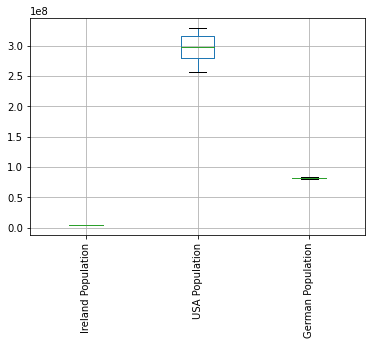

In [47]:
allPopulationData.boxplot(rot=90);

In [48]:
fig = px.line(allPopulationData[['Ireland Population', 'USA Population', 'German Population']].pct_change().cumsum(),
             labels={'value': 'Percentage Population Growth',
                    'Date':'Date'})
fig.update_layout(title_text='Population Percentage Growth Ireland, Germany & USA', 
                  title_x=0.5, legend_title='Population')
fig.show()

## Production Per Capita

In [49]:
bovineMeat = allData.copy()
bovineMeat.drop(bovineMeat.tail(len(allData) - len(irelandPop)).index, inplace=True)

bovineMeatData = pd.DataFrame()
bovineMeatData['Ireland Per Capita Bovine Meat Production'] = bovineMeat['Ireland Bovine Meat'].values / irelandPop['Ireland Population'].values * 1000000
bovineMeatData['USA Per Capita Bovine Meat Production'] = bovineMeat['USA Bovine Meat'].values / usaPop['USA Population'].values * 1000000
bovineMeatData['Germany Per Capita Bovine Meat Production'] = bovineMeat['Germany Bovine Meat'].values / germanyPop['German Population'].values * 1000000

In [50]:
fig = px.line(bovineMeatData.pct_change().cumsum(),
             labels={'value': 'Percentage Cattle Slaughter Growth',
                    'Date':'Date'})
fig.update_layout(title_text='Bovine Meat Percentage Growth Per Capita in Ireland, Germany & USA', 
                  title_x=0.5, legend_title='Per Capita Production')
fig.show()

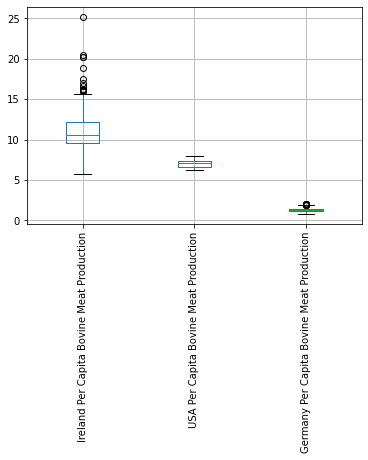

In [51]:
bovineMeatData.boxplot(rot=90);

## Trade

In [52]:
allTrade = pd.concat([irelandTrade, germanyTrade, usaTrade], axis=1)
allTrade

Element,Ireland Surplus,Germany Surplus,USA Surplus
Year,,,
1992-01-01,64855.000000,359471.000000,18592.000000
1992-02-01,65578.666667,351320.416667,15481.000000
1992-03-01,66302.333333,343169.833333,12370.000000
1992-04-01,67026.000000,335019.250000,9259.000000
1992-05-01,67749.666667,326868.666667,6148.000000
...,...,...,...
2019-09-01,29087.333333,15932.666667,1814.666667
2019-10-01,28627.250000,15173.500000,233.250000
2019-11-01,28167.166667,14414.333333,-1348.166667


In [53]:
fig = px.line(allTrade,
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})

fig.show()

In [54]:
fig = px.line(allTrade.pct_change().cumsum(),
             labels={'value': 'Percentage Growth',
                    'Month':'Date'})

fig.show()

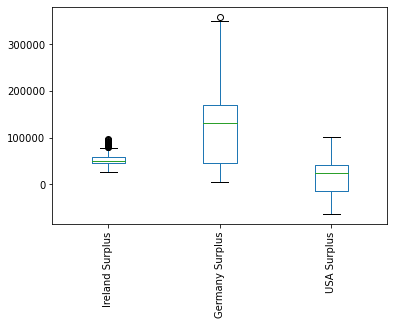

In [55]:
allTrade.plot(kind='box', rot=90);

## Land Productivity Per Meat Annual Data

In [56]:
beefProduction = pd.concat([irelandLand, germanyLand, usaLand], axis=1)

fig = px.line(beefProduction.pct_change().cumsum())

fig.show()

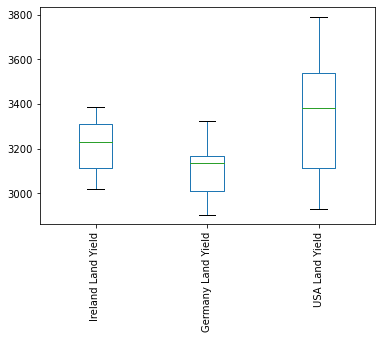

In [57]:
beefProduction.plot(kind='box', rot=90);

## For Machine Learning Model

### Ireland

In [58]:
irelandAllData = pd.concat([irelandGDP, irelandLand, irelandPop, 
                            irelandTrade, prices, irelandData], axis=1).dropna()
irelandAllData

,Ireland GDP,Ireland GDP Per Capita,Ireland Land Yield,Ireland Population,Ireland Surplus,Price,Ireland Bovine Meat
1992-01-01,7.648648e+10,11727.645340,3309.000000,3.558430e+06,64855.000000,251.501130,35.00
1992-02-01,7.665811e+10,11800.642164,3308.500000,3.559916e+06,65578.666667,246.503548,31.90
1992-03-01,7.682973e+10,11873.638988,3308.000000,3.561402e+06,66302.333333,241.505965,46.70
1992-04-01,7.700135e+10,11946.635812,3307.500000,3.562888e+06,67026.000000,236.508382,40.00
1992-05-01,7.717298e+10,12019.632637,3307.000000,3.564374e+06,67749.666667,238.029332,33.80
...,...,...,...,...,...,...,...
2019-09-01,3.472547e+11,73943.352937,3359.333333,4.974596e+06,29087.333333,504.102125,32.97
2019-10-01,3.488885e+11,74154.510385,3361.000000,4.979628e+06,28627.250000,530.363457,61.82
2019-11-01,3.505223e+11,74365.667833,3362.666667,4.984660e+06,28167.166667,503.431642,59.89
2019-12-01,3.521562e+11,74576.825282,3364.333333,4.989692e+06,27707.083333,476.499828,48.25


In [59]:
irelandAllData.describe()

,Ireland GDP,Ireland GDP Per Capita,Ireland Land Yield,Ireland Population,Ireland Surplus,Price,Ireland Bovine Meat
count,3.370000e+02,337.000000,337.000000,3.370000e+02,337.000000,337.000000,337.000000
mean,1.832530e+11,37539.102760,3214.918398,4.230366e+06,52267.605341,293.964892,46.369555
std,7.126150e+10,16453.973254,112.207722,4.644160e+05,12830.756989,102.028848,8.879411
min,7.648648e+10,11727.645340,3018.000000,3.558430e+06,27247.000000,166.215935,20.800000
25%,1.304850e+11,24712.600660,3112.333333,3.754786e+06,44733.000000,201.580708,41.020000
50%,1.874263e+11,37709.449510,3230.000000,4.273591e+06,50424.000000,260.035450,46.290000
75%,2.021030e+11,43651.959882,3309.250000,4.623816e+06,58111.000000,399.768033,51.500000
max,3.537900e+11,74787.982730,3388.000000,4.994724e+06,96894.000000,564.399827,90.000000


In [60]:
ProfileReport(irelandAllData)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Germany

In [61]:
germanyAllData = pd.concat([germanyGDP, germanyLand, germanyPop, 
                            germanyTrade, prices, germanData], axis=1).dropna()
germanyAllData

,Germany GDP,Germany GDP Per Capita,Germany Land Yield,German Population,Germany Surplus,Price,Germany Bovine Meat
1992-01-01,2.261460e+12,21110.926970,2905.000000,8.062460e+07,359471.000000,251.501130,159.17
1992-02-01,2.259619e+12,21149.539621,2908.583333,8.066891e+07,351320.416667,246.503548,140.11
1992-03-01,2.257778e+12,21188.152272,2912.166667,8.071323e+07,343169.833333,241.505965,164.54
1992-04-01,2.255938e+12,21226.764922,2915.750000,8.075754e+07,335019.250000,236.508382,155.61
1992-05-01,2.254097e+12,21265.377573,2919.333333,8.080185e+07,326868.666667,238.029332,144.82
...,...,...,...,...,...,...,...
2019-09-01,3.146117e+12,40929.941070,3301.000000,8.319134e+07,15932.666667,504.102125,93.00
2019-10-01,3.133760e+12,40821.087143,3307.000000,8.320363e+07,15173.500000,530.363457,103.00
2019-11-01,3.121403e+12,40712.233215,3313.000000,8.321593e+07,14414.333333,503.431642,111.00
2019-12-01,3.109047e+12,40603.379287,3319.000000,8.322823e+07,13655.166667,476.499828,89.00


In [62]:
germanyAllData.describe()

,Germany GDP,Germany GDP Per Capita,Germany Land Yield,German Population,Germany Surplus,Price,Germany Bovine Meat
count,3.370000e+02,337.000000,337.000000,3.370000e+02,337.000000,337.000000,337.000000
mean,2.714756e+12,30109.752817,3096.875371,8.194013e+07,122119.363501,293.964892,106.094540
std,2.913565e+11,6046.214500,100.534196,7.235636e+05,73854.001440,102.028848,17.778725
min,2.239370e+12,21110.926970,2905.000000,8.027498e+07,5268.000000,166.215935,59.930000
25%,2.483280e+12,25084.944020,3012.000000,8.152661e+07,46622.333333,201.580708,93.000000
50%,2.691383e+12,28953.420200,3135.000000,8.207547e+07,131788.500000,260.035450,103.000000
75%,2.917240e+12,34860.548200,3166.416667,8.245393e+07,169628.833333,399.768033,116.430000
max,3.244970e+12,41800.772490,3325.000000,8.324052e+07,359471.000000,564.399827,164.540000


In [63]:
ProfileReport(germanyAllData)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### USA

In [64]:
usaAllData = pd.concat([usaGDP, usaLand, usaPop, 
                            usaTrade, prices, usaData], axis=1).dropna()
usaAllData

,USA GDP,USA GDP Per Capita,USA Land Yield,USA Population,USA Surplus,Price,USA Bovine Meat
1992-01-01,1.013920e+13,25418.990780,3014.000000,2.565140e+08,18592.000000,251.501130,2030.459091
1992-02-01,1.016245e+13,25499.682692,3014.000000,2.567978e+08,15481.000000,246.503548,2048.096086
1992-03-01,1.018570e+13,25580.374605,3014.000000,2.570815e+08,12370.000000,241.505965,2043.686838
1992-04-01,1.020895e+13,25661.066517,3014.000000,2.573652e+08,9259.000000,236.508382,2045.891462
1992-05-01,1.023220e+13,25741.758430,3014.000000,2.576490e+08,6148.000000,238.029332,2059.119208
...,...,...,...,...,...,...,...
2019-09-01,1.952117e+13,63897.523730,3670.666667,3.290994e+08,1814.666667,504.102125,2083.370077
2019-10-01,1.946450e+13,63724.773067,3679.000000,3.291956e+08,233.250000,530.363457,2094.393199
2019-11-01,1.940783e+13,63552.022405,3687.333333,3.292918e+08,-1348.166667,503.431642,2120.848692
2019-12-01,1.935117e+13,63379.271743,3695.666667,3.293879e+08,-2929.583333,476.499828,2112.030195


In [65]:
usaAllData.describe()

,USA GDP,USA GDP Per Capita,USA Land Yield,USA Population,USA Surplus,Price,USA Bovine Meat
count,3.370000e+02,337.000000,337.000000,3.370000e+02,337.000000,337.000000,337.000000
mean,1.528919e+13,44424.649180,3351.557864,2.969976e+08,14704.743323,293.964892,2083.134568
std,2.784128e+12,11526.135461,245.170919,2.161276e+07,36284.511873,102.028848,61.463427
min,1.013920e+13,25418.990780,2929.000000,2.565140e+08,-64484.000000,166.215935,1966.524983
25%,1.319360e+13,34513.561500,3112.250000,2.790400e+08,-14452.333333,201.580708,2043.686838
50%,1.594662e+13,46298.731440,3383.000000,2.983799e+08,25188.666667,260.035450,2070.142331
75%,1.725820e+13,53106.536770,3539.000000,3.160599e+08,41027.500000,399.768033,2112.030195
max,1.997450e+13,65279.529030,3791.000000,3.294841e+08,102163.000000,564.399827,2275.172402


In [66]:
ProfileReport(usaAllData)

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# Statistics

https://www.statology.org/python-guides/


In [67]:
import matplotlib.pyplot as plt
import statistics as stats
import statsmodels.api as sm
from statsmodels.formula.api import ols
from scipy import stats
import scipy as scipy

#Homogeinity of variance: Levene's test
from scipy.stats import levene

## QQ Plots

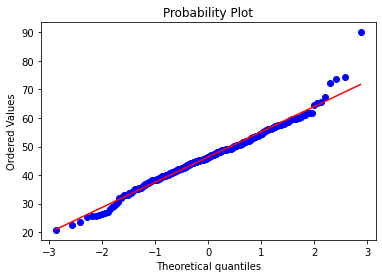

<Figure size 432x288 with 0 Axes>

In [68]:
#Normality plot. Our variable is "charges"
stats.probplot(irelandAllData['Ireland Bovine Meat'], plot=plt)
plt.figure();

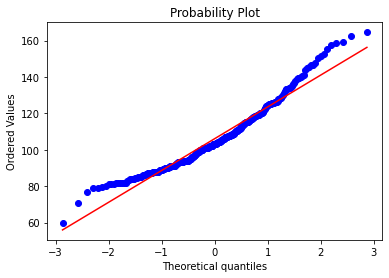

<Figure size 432x288 with 0 Axes>

In [69]:
#Normality plot. Our variable is "charges"
stats.probplot(germanyAllData['Germany Bovine Meat'], plot=plt)
plt.figure();

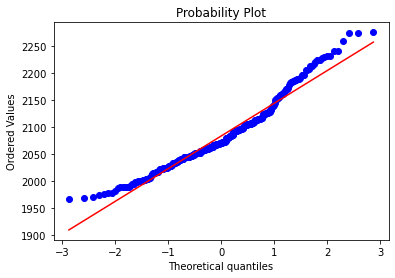

<Figure size 432x288 with 0 Axes>

In [70]:
#Normality plot. Our variable is "charges"
stats.probplot(usaAllData['USA Bovine Meat'], plot=plt)
plt.figure();

## Shapiro Wilk Test

In [71]:
#Shapiro wilk test
stats.shapiro(irelandAllData['Ireland Bovine Meat'])

ShapiroResult(statistic=0.980545699596405, pvalue=0.00015911944501567632)

In [72]:
# Normal Distribution Test
stat, p = stats.normaltest(irelandAllData['Ireland Bovine Meat'])
print('stat=%.3f, p=%3f\n' % (stat,p))

stat=21.897, p=0.000018



In [73]:
result = stats.anderson(irelandAllData['Ireland Bovine Meat'])
print('stat=%.3f' % result.statistic)
for i in range(len(result.critical_values)):
    sig_lev, crit_val = result.significance_level[i], result.critical_values[i]
    if result.statistic < crit_val:
        print('Proboably Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))
    else:
        print('Proboably not Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))

stat=0.912
Proboably not Guassian : 0.569 critical value at 15.0 level of signficance
Proboably not Guassian : 0.648 critical value at 10.0 level of signficance
Proboably not Guassian : 0.778 critical value at 5.0 level of signficance
Proboably not Guassian : 0.907 critical value at 2.5 level of signficance
Proboably Guassian : 1.079 critical value at 1.0 level of signficance


In [74]:
# Chi-Square Normaility Test
statistic, pvalue = stats.chisquare(irelandAllData['Ireland Bovine Meat'])
print('statistic=%.3f, p=%.3f\n' % (statistic, pvalue))

statistic=571.314, p=0.000



In [75]:
#Shapiro wilk test
stats.shapiro(germanyAllData['Germany Bovine Meat'])

ShapiroResult(statistic=0.9548953771591187, pvalue=1.1692160128973228e-08)

In [76]:
# Normal Distribution Test
stat, p = stats.normaltest(germanyAllData['Germany Bovine Meat'])
print('stat=%.3f, p=%3f\n' % (stat,p))

stat=33.696, p=0.000000



In [77]:
result = stats.anderson(germanyAllData['Germany Bovine Meat'])
print('stat=%.3f' % result.statistic)
for i in range(len(result.critical_values)):
    sig_lev, crit_val = result.significance_level[i], result.critical_values[i]
    if result.statistic < crit_val:
        print('Proboably Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))
    else:
        print('Proboably not Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))

stat=4.153
Proboably not Guassian : 0.569 critical value at 15.0 level of signficance
Proboably not Guassian : 0.648 critical value at 10.0 level of signficance
Proboably not Guassian : 0.778 critical value at 5.0 level of signficance
Proboably not Guassian : 0.907 critical value at 2.5 level of signficance
Proboably not Guassian : 1.079 critical value at 1.0 level of signficance


In [78]:
# Chi-Square Normaility Test
statistic, pvalue = stats.chisquare(germanyAllData['Germany Bovine Meat'])
print('statistic=%.3f, p=%.3f\n' % (statistic, pvalue))

statistic=1001.031, p=0.000



In [79]:
#Shapiro wilk test
stats.shapiro(usaAllData['USA Bovine Meat'])

ShapiroResult(statistic=0.9577063322067261, pvalue=2.770600460166861e-08)

In [80]:
# Normal Distribution Test
stat, p = stats.normaltest(usaAllData['USA Bovine Meat'])
print('stat=%.3f, p=%3f\n' % (stat,p))

stat=29.666, p=0.000000



In [81]:
result = stats.anderson(usaAllData['USA Bovine Meat'])
print('stat=%.3f' % result.statistic)
for i in range(len(result.critical_values)):
    sig_lev, crit_val = result.significance_level[i], result.critical_values[i]
    if result.statistic < crit_val:
        print('Proboably Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))
    else:
        print('Proboably not Guassian : {} critical value at {} level of signficance'.format(crit_val,sig_lev))

stat=4.217
Proboably not Guassian : 0.569 critical value at 15.0 level of signficance
Proboably not Guassian : 0.648 critical value at 10.0 level of signficance
Proboably not Guassian : 0.778 critical value at 5.0 level of signficance
Proboably not Guassian : 0.907 critical value at 2.5 level of signficance
Proboably not Guassian : 1.079 critical value at 1.0 level of signficance


In [82]:
# Chi-Square Normaility Test
statistic, pvalue = stats.chisquare(usaAllData['USA Bovine Meat'])
print('statistic=%.3f, p=%.3f\n' % (statistic, pvalue))

statistic=609.334, p=0.000



In [83]:
levene(irelandAllData['Ireland Bovine Meat'],
       germanyAllData['Germany Bovine Meat'],
       usaAllData['USA Bovine Meat'], 
       center = 'mean')

LeveneResult(statistic=302.22289896043605, pvalue=1.4845857018439324e-103)

In [84]:
#perform one-way ANOVA
stats.f_oneway(irelandAllData['Ireland Bovine Meat'],
       germanyAllData['Germany Bovine Meat'],
       usaAllData['USA Bovine Meat'])

F_onewayResult(statistic=325503.5807404495, pvalue=0.0)

In [85]:
#perform Mann-Kendall Trend Test
import pymannkendall as mk

mk.original_test(irelandAllData['Ireland Bovine Meat'])

Mann_Kendall_Test(trend='increasing', h=True, p=1.6705501758584873e-05, z=4.304908168911338, Tau=0.15716405256464602, s=8898.0, var_s=4271293.333333333, slope=0.02166666666666656, intercept=42.65000000000002)

In [86]:
mk.original_test(germanyAllData['Germany Bovine Meat'])

Mann_Kendall_Test(trend='decreasing', h=True, p=0.0, z=-13.826207982864648, Tau=-0.5047159813480289, s=-28575.0, var_s=4271062.333333333, slope=-0.12112033138666302, intercept=123.34821567295938)

In [87]:
mk.original_test(usaAllData['USA Bovine Meat'])

Mann_Kendall_Test(trend='increasing', h=True, p=0.0, z=9.015737816134482, Tau=0.3290765861240639, s=18631.0, var_s=4269953.666666667, slope=0.2738663876004681, intercept=2024.1327774356887)

## Mann-Whitney U test

In [88]:
#perform the Mann-Whitney U test
stats.mannwhitneyu(irelandAllData['Ireland Bovine Meat'], 
                   germanyAllData['Germany Bovine Meat'], 
                   alternative='two-sided')

MannwhitneyuResult(statistic=77.5, pvalue=1.7569631292776826e-111)

In [89]:
#perform the Mann-Whitney U test
stats.mannwhitneyu(irelandAllData['Ireland Bovine Meat'], 
                   usaAllData['USA Bovine Meat'], 
                   alternative='two-sided')

MannwhitneyuResult(statistic=0.0, pvalue=8.753468717400352e-112)

In [90]:
#perform the Mann-Whitney U test
stats.mannwhitneyu(germanyAllData['Germany Bovine Meat'], 
                   usaAllData['USA Bovine Meat'], 
                   alternative='two-sided')

MannwhitneyuResult(statistic=0.0, pvalue=8.740854439028161e-112)

## Regions Two Way Anova

In [91]:
cols = ['GDP', 'GDPPerCapita', 'LandYield', 'Population', 'Surplus', 'Price', 'BovineMeat']
region1 = irelandAllData.copy()
region1.columns = cols
region1['Region'] = 'Ireland'

region2 = germanyAllData.copy()
region2.columns = cols
region2['Region'] = 'Germany'

region3 = usaAllData.copy()
region3.columns = cols
region3['Region'] = 'USA'

regions = pd.concat([region1, region2, region3], axis=0)
regions.reset_index(inplace=True, drop=True)
regions

,GDP,GDPPerCapita,LandYield,Population,Surplus,Price,BovineMeat,Region
0,7.648648e+10,11727.645340,3309.000000,3.558430e+06,64855.000000,251.501130,35.000000,Ireland
1,7.665811e+10,11800.642164,3308.500000,3.559916e+06,65578.666667,246.503548,31.900000,Ireland
2,7.682973e+10,11873.638988,3308.000000,3.561402e+06,66302.333333,241.505965,46.700000,Ireland
3,7.700135e+10,11946.635812,3307.500000,3.562888e+06,67026.000000,236.508382,40.000000,Ireland
4,7.717298e+10,12019.632637,3307.000000,3.564374e+06,67749.666667,238.029332,33.800000,Ireland
...,...,...,...,...,...,...,...,...
1006,1.952117e+13,63897.523730,3670.666667,3.290994e+08,1814.666667,504.102125,2083.370077,USA
1007,1.946450e+13,63724.773067,3679.000000,3.291956e+08,233.250000,530.363457,2094.393199,USA
1008,1.940783e+13,63552.022405,3687.333333,3.292918e+08,-1348.166667,503.431642,2120.848692,USA
1009,1.935117e+13,63379.271743,3695.666667,3.293879e+08,-2929.583333,476.499828,2112.030195,USA


In [92]:
#ONE-WAY ANOVA
model = ols('BovineMeat~Region', data = regions).fit()
aov = sm.stats.anova_lm(model, type=2)
print(aov)

              df        sum_sq       mean_sq             F  PR(>F)
Region       2.0  9.054815e+08  4.527407e+08  325503.58074     0.0
Residual  1008.0  1.402020e+06  1.390893e+03           NaN     NaN


In [93]:
#ANOVA TWO WAYS
model2 = ols('BovineMeat~Region+LandYield', data = regions).fit()
aov2 = sm.stats.anova_lm(model2, type=2)
print(aov2)

               df        sum_sq       mean_sq              F        PR(>F)
Region        2.0  9.054815e+08  4.527407e+08  369498.122454  0.000000e+00
LandYield     1.0  1.681578e+05  1.681578e+05     137.239663  8.313108e-30
Residual   1007.0  1.233863e+06  1.225286e+03            NaN           NaN


In [94]:
#ANOVA TWO WAYS
model2 = ols('BovineMeat~Region+Surplus', data = regions).fit()
aov2 = sm.stats.anova_lm(model2, type=2)
print(aov2)

              df        sum_sq       mean_sq              F        PR(>F)
Region       2.0  9.054815e+08  4.527407e+08  346198.247990  0.000000e+00
Surplus      1.0  8.511622e+04  8.511622e+04      65.086006  2.027624e-15
Residual  1007.0  1.316904e+06  1.307750e+03            NaN           NaN


# Data PreProcessing

## SARI MAX

In [95]:
from statsmodels.tsa.seasonal import seasonal_decompose
from scipy.stats import norm
import statsmodels.api as sm

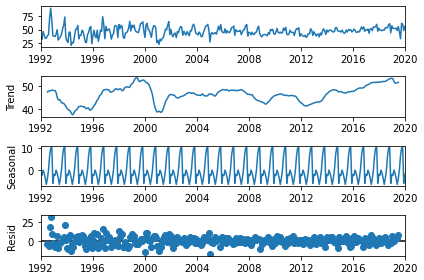

In [96]:
decompose_data = seasonal_decompose(irelandAllData[['Ireland Bovine Meat']], model="additive")
decompose_data.plot();

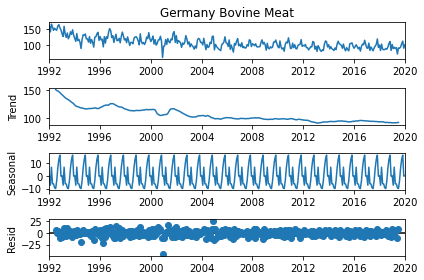

In [97]:
decompose_data = seasonal_decompose(germanyAllData['Germany Bovine Meat'], model="additive")
decompose_data.plot();

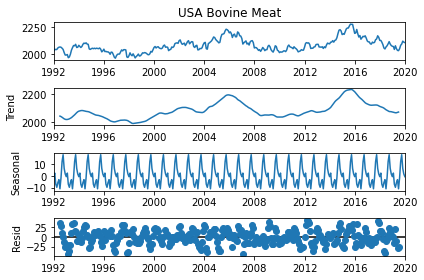

In [98]:
decompose_data = seasonal_decompose(usaAllData['USA Bovine Meat'], model="additive")
decompose_data.plot();

In [99]:
from statsmodels.tsa.stattools import adfuller
dftest = adfuller(irelandAllData[['Ireland Bovine Meat']], autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -3.2397494171804424
2. P-Value :  0.017796078747002026
3. Num Of Lags :  14
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 322
5. Critical Values :
	 1% :  -3.4508226600665037
	 5% :  -2.870558121868621
	 10% :  -2.571574731684734


In [100]:
data = irelandAllData[['Ireland Bovine Meat']]
data

,Ireland Bovine Meat
1992-01-01,35.00
1992-02-01,31.90
1992-03-01,46.70
1992-04-01,40.00
1992-05-01,33.80
...,...
2019-09-01,32.97
2019-10-01,61.82
2019-11-01,59.89
2019-12-01,48.25


C:\Users\irish\AppData\Local\Temp\ipykernel_22384\2237784512.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



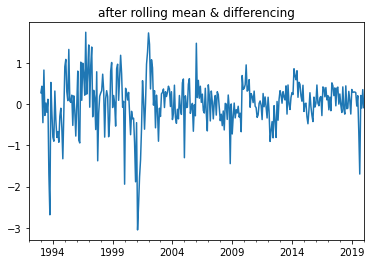

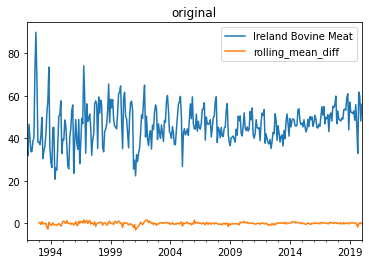

In [101]:
rolling_mean = data.rolling(window = 12).mean()
data['rolling_mean_diff'] = rolling_mean - rolling_mean.shift()
ax1 = plt.subplot()
data['rolling_mean_diff'].plot(title='after rolling mean & differencing');
ax2 = plt.subplot()
data.plot(title='original');

In [102]:
dftest = adfuller(data['rolling_mean_diff'].dropna(), autolag = 'AIC')
print("1. ADF : ",dftest[0])
print("2. P-Value : ", dftest[1])
print("3. Num Of Lags : ", dftest[2])
print("4. Num Of Observations Used For ADF Regression and Critical Values Calculation :", dftest[3])
print("5. Critical Values :")
for key, val in dftest[4].items():
    print("\t",key, ": ", val)

1. ADF :  -4.7508920426068695
2. P-Value :  6.745540284934725e-05
3. Num Of Lags :  13
4. Num Of Observations Used For ADF Regression and Critical Values Calculation : 311
5. Critical Values :
	 1% :  -3.451552879535732
	 5% :  -2.8708786756338407
	 10% :  -2.571745666091128


In [103]:
# Fit the model
mod = sm.tsa.statespace.SARIMAX(data['Ireland Bovine Meat'], trend='c', order=(1,1,1))
res = mod.fit(disp=False)
print(res.summary())

                                SARIMAX Results                                
Dep. Variable:     Ireland Bovine Meat   No. Observations:                  337
Model:                SARIMAX(1, 1, 1)   Log Likelihood               -1169.110
Date:                 Mon, 09 May 2022   AIC                           2346.219
Time:                         00:23:06   BIC                           2361.488
Sample:                     01-01-1992   HQIC                          2352.306
                          - 01-01-2020                                         
Covariance Type:                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0089      0.006      1.384      0.166      -0.004       0.021
ar.L1          0.4582      0.036     12.804      0.000       0.388       0.528
ma.L1         -0.9997      0.355     -2.817 

In [104]:
model=sm.tsa.arima.ARIMA(data['Ireland Bovine Meat'],order=(1,1,1))
history=model.fit()

In [105]:
history.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                SARIMAX Results                                
===============================================================================
Dep. Variable:     Ireland Bovine Meat   No. Observations:                  337
Model:                  ARIMA(1, 1, 1)   Log Likelihood               -1170.422
Date:                 Mon, 09 May 2022   AIC                           2346.845
Time:                         00:23:06   BIC                           2358.296
Sample:                     01-01-1992   HQIC                          2351.409
                          - 01-01-2020                                         
Covariance Type:                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.4528      0.035     12.762      0.000       0.383       0.522
ma.L1         -0.9812      0.015    -65.908      0.000      -1.010      -0.952
sigma2        61.6794      3.323     18.564      0.000      55.167      68.191
===================================================================================
Ljung-Box (L1) (Q):                   0.41   Jarque-Bera (JB):                80.61
Prob(Q):                              0.52   Prob(JB):                         0.00
Heteroskedasticity (H):               0.21   Skew:                             0.07
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.39
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

# Machine Learning Models

In [106]:
from xgboost import XGBRegressor
#from sklearn.model_selection import RepeatedKFold, cross_val_score
#from sklearn.metrics import r2_score

In [107]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.pipeline import make_pipeline
from sklearn.decomposition import PCA
from sklearn.linear_model import Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.impute import SimpleImputer

In [108]:
def fit(self, X, y):
    X_transformed = X
    for name, estimator in self.steps[:-1]:
        # iterate over all but the final step
        # fit and transform the data
        X_transformed = estimator.fit_transform(X_transformed, y)
    # fit the last step
    self.steps[-1][1].fit(X_transformed, y)
    return self

def predict(self, X):
    X_transformed = X
    for step in self.steps[:-1]:
        # iterate over all but the final step
        # transform the data
        X_transformed = step[1].transform(X_transformed)
    # fit the last step
    return self.steps[-1][1].predict(X_transformed)

In [109]:
irelandAllData.insert(loc=0, column='Month', value=irelandAllData.index.month)
irelandAllData.Month = irelandAllData.astype(str)

In [110]:
X_train, X_test, y_train, y_test = train_test_split(irelandAllData.iloc[:, :-1], 
                                irelandAllData.iloc[:, -1], 
                                test_size = 0.40, shuffle=False)

In [111]:
# get the categorical and numeric column names
num_cols = X_train.select_dtypes(exclude=['object']).columns.tolist()
cat_cols = X_train.select_dtypes(include=['object']).columns.tolist()

In [112]:
# pipeline for numerical columns
num_pipe = make_pipeline(
    SimpleImputer(strategy='median'))

# pipeline for categorical columns
cat_pipe = make_pipeline(
    SimpleImputer(strategy='constant', fill_value='N/A'),
    OneHotEncoder(handle_unknown='ignore', sparse=False))

# combine both the pipelines
full_pipe = ColumnTransformer([
    ('num', num_pipe, num_cols),
    ('cat', cat_pipe, cat_cols)])

## Ridge

In [113]:
pipe = make_pipeline(full_pipe, StandardScaler(), Ridge())

paramGrid = {'ridge__normalize': [True, False],
            'ridge__alpha' : [10.0, 1.0, 0.1, 0.001, 0.0001]}

grid = GridSearchCV(pipe, paramGrid, cv=5)

grid.fit(X_train, y_train)

#print("Best estimator:\n{}".format(grid.best_estimator_))

print('R2 Train Score {} '.format(grid.score(X_train, y_train)))
print('R2 Test Score {} '.format(grid.score(X_test, y_test)))

R2 Train Score 0.4586148489671966 
R2 Test Score 0.24739737941503026 


In [114]:
pipe = make_pipeline(full_pipe, StandardScaler(), Lasso())

paramGrid = {'lasso__normalize': [True, False],
            'lasso__alpha' : [10.0, 1.0, 0.1, 0.001, 0.0001]}

grid = GridSearchCV(pipe, paramGrid, cv=5)

grid.fit(X_train, y_train)

#print("Best estimator:\n{}".format(grid.best_estimator_))

print('R2 Train Score {} '.format(grid.score(X_train, y_train)))
print('R2 Test Score {} '.format(grid.score(X_test, y_test)))

C:\Users\irish\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 156.55408425237965, tolerance: 1.9855981800000002

C:\Users\irish\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 1994.5699500231242, tolerance: 1.6589744812345681

C:\Users\irish\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 3360.5005294641032, tolerance: 1.9855981800000002

C:\Users\irish\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might wan

R2 Train Score 0.5033552941917134 
R2 Test Score -0.0027500674851672624 


C:\Users\irish\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 2551.975579022207, tolerance: 1.707278879503106

C:\Users\irish\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 3217.922783251088, tolerance: 1.6589744812345681

C:\Users\irish\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 3673.476416770445, tolerance: 1.9855981800000002

C:\Users\irish\AppData\Roaming\Python\Python38\site-packages\sklearn\linear_model\_coordinate_descent.py:529: ConvergenceWarning:

Objective did not converge. You might want to

## PolyNomial Features Ridge

In [115]:
pipe = make_pipeline(full_pipe, StandardScaler(), PolynomialFeatures(), Ridge())

paramGrid = {'polynomialfeatures__degree': [1, 2, 3],
'ridge__alpha': [0.001, 0.01, 0.1, 1, 10, 100]}

grid = RandomizedSearchCV(pipe, paramGrid, cv=5, n_jobs=-1)
grid.fit(X_train, y_train)

#print("Best estimator:\n{}".format(grid.best_estimator_))

print('R2 Train Score {} '.format(grid.score(X_train, y_train)))
print('R2 Test Score {} '.format(grid.score(X_test, y_test)) )

R2 Train Score 0.5383066075855889 
R2 Test Score 0.09480659484661358 


## Random Forest

In [116]:
pipe = make_pipeline(full_pipe, StandardScaler(), 
                     RandomForestRegressor())

paramGrid = {'randomforestregressor__n_estimators': [100, 200, 300, 500],
            'randomforestregressor__max_depth': [10, 50, 70, 100],
            'randomforestregressor__bootstrap': [True, False]}

grid = GridSearchCV(pipe, paramGrid, cv=5, n_jobs=-1)
grid.fit(X_train, y_train)

#print("Best estimator:\n{}".format(grid.best_estimator_))

print('R2 Train Score {} '.format(grid.score(X_train, y_train)))
print('R2 Test Score {} '.format(grid.score(X_test, y_test)) )

R2 Train Score 0.9402471474649565 
R2 Test Score -2.189662069351757 


## XGBoost

In [117]:
pipe = make_pipeline(full_pipe, StandardScaler(), XGBRegressor())

paramGrid = {'xgbregressor__max_depth': [2, 4, 6],
            'xgbregressor__n_estimators': [50, 100, 200]}

grid = GridSearchCV(pipe, paramGrid, cv=5, n_jobs=-1)
grid.fit(X_train, y_train)

#print("Best estimator:\n{}".format(grid.best_estimator_))

print('R2 Train Score {} '.format(grid.score(X_train, y_train)))
print('R2 Test Score {} '.format(grid.score(X_test, y_test)))

R2 Train Score 0.8618287814409252 
R2 Test Score -1.4474470044235845 


In [118]:
from sklearn.neighbors import KNeighborsRegressor


pipe = make_pipeline(full_pipe, MinMaxScaler(), KNeighborsRegressor())

paramGrid = {'kneighborsregressor__n_neighbors': [2, 3, 4, 5, 6, 7, 10, 15, 20, 30,100],
            'kneighborsregressor__p': [1, 2]}

grid = GridSearchCV(pipe, paramGrid, cv=5, n_jobs=-1)
grid.fit(X_train, y_train)

#print("Best estimator:\n{}".format(grid.best_estimator_))

print('R2 Train Score {} '.format(grid.score(X_train, y_train)))
print('R2 Test Score {} '.format(grid.score(X_test, y_test)))

R2 Train Score 0.6053531104527132 
R2 Test Score 0.06825394769975235 
